<a href="https://colab.research.google.com/github/nikhilnimbalkar1/STS/blob/master/STS_model_SICK.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Siamese Manhattan LSTM-RNN for Semantic Similarity of Text(SICK dataset). 
This architecture is based on [this keras model ](https://github.com/eliorc/Medium/blob/master/MaLSTM.ipynb) , you can also try any other implementations from [this link](https://github.com/nikhilnimbalkar1?tab=stars).Try enhancing the model individually and share all progress.

In [0]:
import tensorflow as tf
import pandas as pd
import numpy as np
import tensorflow_hub as hub
import matplotlib.pyplot as plt
import os
import csv
import scipy
import tensorflow.keras.backend as K
import datetime

Load Tensorboard for visualization.

In [0]:
%load_ext tensorboard

Module required to save models in "h5" format

In [0]:
!pip3 install -q pyyaml h5py 

Import and export files to google Drive

In [4]:
from google.colab import drive
drive.mount('/content/gdrive',force_remount=True)

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive


Load Dataset and clean up some values.

In [0]:
def load_SICK():
  sick=pd.read_csv('/content/gdrive/My Drive/Colab Notebooks/Datasets_STS/SICK.tsv',sep='\t',usecols=['sentence_A','sentence_B','relatedness_score'])
  sick=sick.rename(columns={'sentence_A':'sent_1','sentence_B':'sent_2','relatedness_score':'sim'})
  return sick

Load Universal Sentence Encoder transformer model.Alternatively we can use DAN model too. 

In [0]:
def load_USE():
  use_model_url="https://tfhub.dev/google/universal-sentence-encoder-large/5"
  embed=hub.load("https://tfhub.dev/google/universal-sentence-encoder-large/5")
  return embed

Helper Function to calculate Manhattan Distance between the final output Tensors

In [0]:
def manhattan_distance(left, right):
    return K.exp(-K.sum(K.abs(left-right), axis=1, keepdims=True))

Prepare Data and convert both sentences to embeddings seperately and convert the similarity column to Tensor type too.
Shuffling and Repeating the data from Tensorflow API should be used too to get accurate models.We'll try that individually and compare models later.

In [0]:
embed=load_USE()
def prepare_data(sts_data):
  sts_encode1 = tf.nn.l2_normalize(embed(tf.constant(sts_data['sent_1'].tolist())), axis=1)
  sts_encode2 = tf.nn.l2_normalize(embed(tf.constant(sts_data['sent_2'].tolist())), axis=1)
  sts_encode1=tf.expand_dims(sts_encode1,axis=2)
  sts_encode2=tf.expand_dims(sts_encode2,axis=2)
  sts_sims=sts_data['sim']
  sts_sims=tf.convert_to_tensor(sts_sims)
  #Normalise similarity score using Min-Max normalization as our output won't vary from 0 to 5
  sts_sims=tf.divide(tf.subtract(sts_sims,tf.reduce_min(sts_sims)),tf.subtract(tf.reduce_max(sts_sims),tf.reduce_min(sts_sims)))
  return sts_encode1,sts_encode2,sts_sims


Building model with appropriate data.

In [0]:
sick=load_SICK()

In [0]:
train_embeddings1,train_embeddings2,train_similarity=prepare_data(sick)

# LSTM Model 

This is the input model to the final output.This will make our Siamese architecture.We need to enhance this model by adding different layers and check for overfitting and underfitting accordingly.Make changes to this model first and analyse accuracy and loss. You can check the inputs of each layer by executing **model.summary()**.
LSTM layers must have a 3D input always.

In [0]:
lstm_model=tf.keras.Sequential([
                                tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(128,return_sequences=True,kernel_regularizer=tf.keras.regularizers.l2(0.3))),
                                tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(64,return_sequences=True,kernel_regularizer=tf.keras.regularizers.l2(0.3))),
                                tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(32,return_sequences=True,kernel_regularizer=tf.keras.regularizers.l2(0.3))),
                                tf.keras.layers.Dense(1,activation='relu')
])

Input shapes for the siamese model and output tensors from the LSTM model.

In [0]:
inp1=tf.keras.Input(shape=[512,1])
inp2=tf.keras.Input(shape=[512,1])
out1=lstm_model(inp1)
out2=lstm_model(inp2)

Calculating Manhattan Distance of the output Tensors.We may try a few different distance calcaulations too if required.

In [0]:
malstm_dist=tf.keras.layers.Lambda(function=lambda x: manhattan_distance(x[0], x[1]),output_shape=lambda x: (x[0][0], 1))([out1, out2])

# Final Model
The final model takes the LSTM models as input and gives Manhattan Distance as Output. 

In [0]:
malstm = tf.keras.Model([inp1, inp2], [malstm_dist])
malstm.compile(optimizer=tf.keras.optimizers.Adam(),loss=tf.keras.losses.MeanSquaredError())

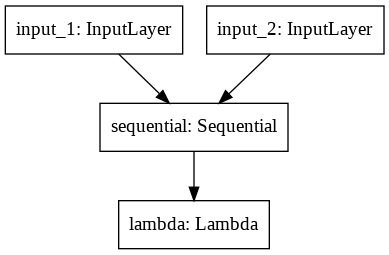

In [15]:
tf.keras.utils.plot_model(malstm)

In [16]:
malstm.summary()
lstm_model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 512, 1)]     0                                            
__________________________________________________________________________________________________
input_2 (InputLayer)            [(None, 512, 1)]     0                                            
__________________________________________________________________________________________________
sequential (Sequential)         (None, 512, 1)       338753      input_1[0][0]                    
                                                                 input_2[0][0]                    
__________________________________________________________________________________________________
lambda (Lambda)                 (None, 1, 1)         0           sequential[0][0]             

# Callbacks
Early Stopping callback to stop training if validation loss is not improving.ModelCheckpoint to save the best model during training to google drive.
Tensorboard Callback to vizualize the training analytics. 

In [0]:
es=tf.keras.callbacks.EarlyStopping(monitor='val_loss',mode="min",patience=2)
best_model_save=tf.keras.callbacks.ModelCheckpoint('/content/gdrive/My Drive/Colab Notebooks/STS_models/best_model_sick.h5',monitor='val_loss',save_best_only=True,mode='min')
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1,embeddings_freq=1,write_images=True)

In [18]:
model_hist=malstm.fit([train_embeddings1,train_embeddings2],train_similarity,epochs=10,validation_split=0.2,shuffle=True,batch_size=64,validation_batch_size=64,callbacks=[es,best_model_save,tensorboard_callback],use_multiprocessing=True)

Epoch 1/10
  2/123 [..............................] - ETA: 1:15 - loss: 228.9233WARNING:tensorflow:Method (on_train_batch_end) is slow compared to the batch update (0.445885). Check your callbacks.


123/123 [==============================] - 42s 339ms/step - loss: 65.6364 - val_loss: 5.4968
Epoch 2/10
123/123 [==============================] - 37s 305ms/step - loss: 1.4047 - val_loss: 0.1507
Epoch 3/10
123/123 [==============================] - 38s 307ms/step - loss: 0.2514 - val_loss: 0.1324
Epoch 4/10
123/123 [==============================] - 38s 309ms/step - loss: 0.0837 - val_loss: 0.0621
Epoch 5/10
123/123 [==============================] - 38s 306ms/step - loss: 0.0489 - val_loss: 0.0442
Epoch 6/10
123/123 [==============================] - 38s 305ms/step - loss: 0.0395 - val_loss: 0.0417
Epoch 7/10
123/123 [==============================] - 38s 305ms/step - loss: 0.0369 - val_loss: 0.0385
Epoch 8/10
123/123 [==============================] - 37s 301ms/step - loss: 0.0459 - val_loss: 0.0955
Epoch 9/10
123/123 [==============================] - 37s 301ms/step - loss: 0.0451 - val_loss: 0.0404


# Tensorboard
Visualization tool for the trained model.Check out features such as embeddings projector, Training graphs and others individually. 

In [19]:
%tensorboard --logdir logs/fit

<IPython.core.display.Javascript object>

# Prediction

In [0]:
def create_embeddings(sentence):
    embedding = tf.nn.l2_normalize(embed(sentence), axis=1)
    embedding=tf.expand_dims(embedding,axis=2)
    return embedding

In [0]:
sent1=create_embeddings(["Reports that the NSA eavesdropped on world leaders have severely shaken relations between Europe and the U.S., German Chancellor Angela Merkel said."])
sent2=create_embeddings(["Germany and France are to seek talks with the US to settle a row over spying, as espionage claims continue to overshadow an EU summit in Brussels."])

In [22]:
sem_sim=float(malstm.predict([sent1,sent2]))
print("Semantic Similarity: ",sem_sim*100,"%")

Semantic Similarity:  49.90265071392059 %
